# Data analysis with Python

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import *
import matplotlib as mpl 

import mplcyberpunk
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt 
%matplotlib inline

plt.style.use("cyberpunk")
pd.set_option("display.max_rows", 100) 
pd.set_option("display.max_columns", 100) 

import warnings
warnings.filterwarnings("ignore") 

In [2]:
mpl.rcParams["font.style"] = "italic"
mpl.rcParams["font.weight"] = "bold"
mpl.rcParams["axes.linewidth"] = 1.0
mpl.rcParams["figure.dpi"] = 200
mpl.rcParams["axes.titlesize"] = 18
mpl.rcParams["axes.labelsize"] = 15
mpl.rcParams["axes.titleweight"] = "bold"
mpl.rcParams["axes.titlelocation"] = "left"
mpl.rcParams["axes.spines.top"] = False
mpl.rcParams["axes.spines.right"] = False
mpl.rcParams["axes.labelweight"] = "bold"
mpl.rcParams["axes.labelpad"] = 5.0
mpl.rcParams["axes.titlepad"] = 10.0
mpl.rcParams['xtick.labelsize'] = 15
mpl.rcParams['ytick.labelsize'] = 15

In [3]:
train = pd.read_csv("/storage/emulated/0/Dataset_MGP_LHS/train.csv")
test = pd.read_csv("/storage/emulated/0/Dataset_MGP_LHS/test.csv")
sub = pd.read_csv("/storage/emulated/0/Dataset_MGP_LHS/submission.csv")

## Univariat & Bivariat Analysis

In [9]:
train.head() 

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Bruno Mars,That's What I Like (feat. Gucci Mane),60.0,0.854,0.564,1.0,-4.964,1,0.0485,0.017100,NaN,0.0849,0.8990,134.071,234596.0,4,5
1,Boston,Hitch a Ride,54.0,0.382,0.814,3.0,-7.230,1,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4,10
2,The Raincoats,No Side to Fall In,35.0,0.434,0.614,6.0,-8.334,1,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4,6
3,Deno,Lingo (feat. J.I & Chunkz),66.0,0.853,0.597,10.0,-6.528,0,0.0555,0.021200,NaN,0.1220,0.5690,107.033,173968.0,4,5
4,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,53.0,0.167,0.975,2.0,-4.279,1,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4,10


In [10]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17996 entries, 0 to 17995
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Artist Name         17996 non-null  object 
 1   Track Name          17996 non-null  object 
 2   Popularity          17568 non-null  float64
 3   danceability        17996 non-null  float64
 4   energy              17996 non-null  float64
 5   key                 15982 non-null  float64
 6   loudness            17996 non-null  float64
 7   mode                17996 non-null  int64  
 8   speechiness         17996 non-null  float64
 9   acousticness        17996 non-null  float64
 10  instrumentalness    13619 non-null  float64
 11  liveness            17996 non-null  float64
 12  valence             17996 non-null  float64
 13  tempo               17996 non-null  float64
 14  duration_in min/ms  17996 non-null  float64
 15  time_signature      17996 non-null  int64  
 16  Clas

In [11]:
pd.DataFrame({"Train/null":(train.isnull().sum()/train.shape[0])*100,
              "Test/null":(test.isnull().sum()/test.shape[0])*100}).sort_values("Train/null", ascending=False) 

,Train/null,Test/null
instrumentalness,24.322072,24.750421
key,11.191376,10.475820
Popularity,2.378306,2.943083
time_signature,0.000000,0.000000
tempo,0.000000,0.000000
speechiness,0.000000,0.000000
mode,0.000000,0.000000
loudness,0.000000,0.000000
liveness,0.000000,0.000000
Artist Name,0.000000,0.000000


In [14]:
train.duplicated().sum() 

0

In [ ]:
# target

In [4]:
class_genre = {0:'Acoustic/Folk', 
               1:"Alt Music", 
               2:"Blues", 
               3:"Bollywood", 
               4:"Country", 
               5:"HipHop", 
               6:"Indie Alt", 
               7:"Instrumental", 
               8:"Metal", 
               9:"Pop", 
               10:"Rock"}

In [5]:
train["Class_Genre"] = train.Class.map(class_genre)

In [6]:
train.Class_Genre.value_counts()

Rock             4949
Indie Alt        2587
Pop              2524
Metal            1854
HipHop           1447
Alt Music        1373
Blues            1272
Acoustic/Folk     625
Instrumental      576
Bollywood         402
Country           387
Name: Class_Genre, dtype: int64

Text(0, 0.5, 'Count')

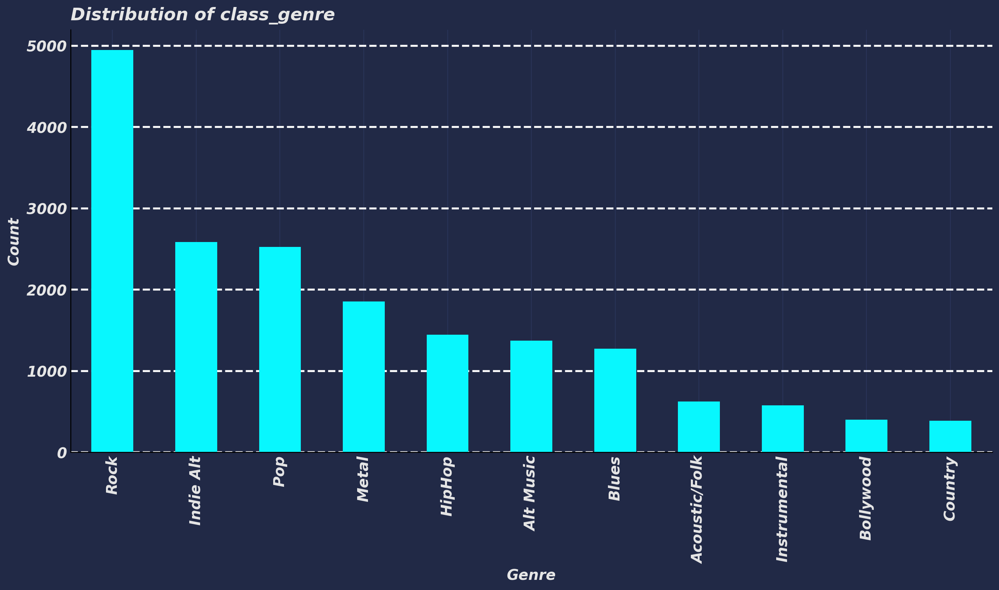

In [15]:
train.Class_Genre.value_counts().plot(kind="bar",figsize=(17,8))
plt.grid(axis="y", linewidth=2, linestyle="--", color="white") 
plt.title("Distribution of class_genre")
plt.xlabel("Genre")
plt.ylabel("Count")


In [7]:
train.drop("Class",axis=1,inplace=True)

In [8]:
cater = train.select_dtypes("object").columns
number = train.select_dtypes("number").columns

In [ ]:
# Categorical Feature

In [8]:
train[cater].describe()

,Artist Name,Track Name,Class_Genre
count,17996,17996,17996
unique,9149,15129,11
top,Backstreet Boys,Dreams,Rock
freq,69,9,4949


In [19]:
train["Artist Name"].value_counts()[:10]

Backstreet Boys       69
Westlife              60
Britney Spears        54
Omer Adam             48
Eyal Golan            48
Shlomo Artzi          39
The Rolling Stones    38
Itay Levi             35
Arik Einstein         35
Dudu Aharon           34
Name: Artist Name, dtype: int64

In [20]:
train["Artist Name"].value_counts().tail(10) 

Future Palace                                                                               1
Jamie Berry                                                                                 1
Chromeo                                                                                     1
Crowbar                                                                                     1
Maor Cohen                                                                                  1
CMC 3                                                                                       1
PONY                                                                                        1
Useless ID                                                                                  1
Wolfgang Amadeus Mozart, Mirijam Contzen, Bayerische Kammerphilharmonie, Reinhard Goebel    1
Jamiroquai                                                                                  1
Name: Artist Name, dtype: int64

(-0.5, 1999.5, 1199.5, -0.5)

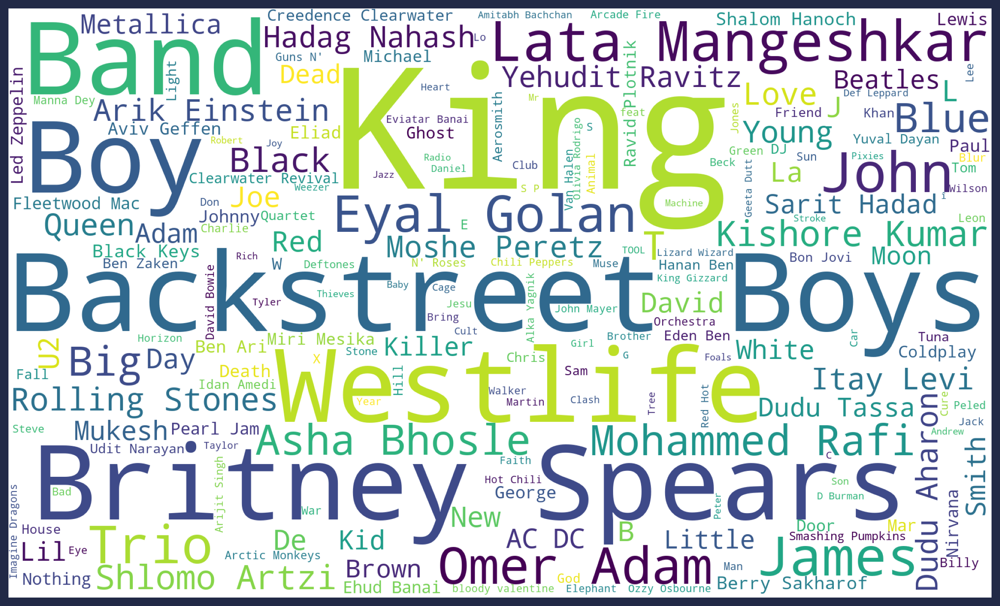

In [9]:
plt.figure(figsize=(15,15))
wordcloud = WordCloud(
    background_color='white',
    width = 2000,
    height = 1200
).generate(" ".join(train["Artist Name"])) 

plt.title("Artist Name")
plt.imshow(wordcloud)
plt.axis('off')

In [32]:
print("memeriksa artist dengan genre music nya: \n") 
for genre in list(class_genre.values()):
    print(f"Genre {genre}>") 
    per = train[train.Class_Genre == genre]
    print(f"Punya: {per['Artist Name'].nunique()} Artist\n") 

memeriksa artist dengan genre music nya: 

Genre Acoustic/Folk>
Punya: 546 Artist

Genre Alt Music>
Punya: 1118 Artist

Genre Blues>
Punya: 791 Artist

Genre Bollywood>
Punya: 203 Artist

Genre Country>
Punya: 218 Artist

Genre HipHop>
Punya: 886 Artist

Genre Indie Alt>
Punya: 1916 Artist

Genre Instrumental>
Punya: 490 Artist

Genre Metal>
Punya: 1163 Artist

Genre Pop>
Punya: 1461 Artist

Genre Rock>
Punya: 2580 Artist



In [ ]:
#Track Name

In [27]:
train["Track Name"].value_counts().head(10)

Dreams            9
Runaway           8
Fire              8
Forever           7
Hurricane         7
Home              7
Ghost             7
Control           6
Blue              6
All My Friends    6
Name: Track Name, dtype: int64

In [39]:
train["Track Name"].sample(10)

4559                                                 I Ran
2344                                         THAT ONE SONG
11073                                       Lose Your Head
16268                                     Hollywood Ending
1750                                      Life is Perfecto
1251                                       Stacking Chairs
9024                                          Funk Express
9653     Introduction (Live At Woodstock) - Live at The...
15867                                      Your Love (9PM)
7899                                              Longclaw
Name: Track Name, dtype: object

(-0.5, 1999.5, 1199.5, -0.5)

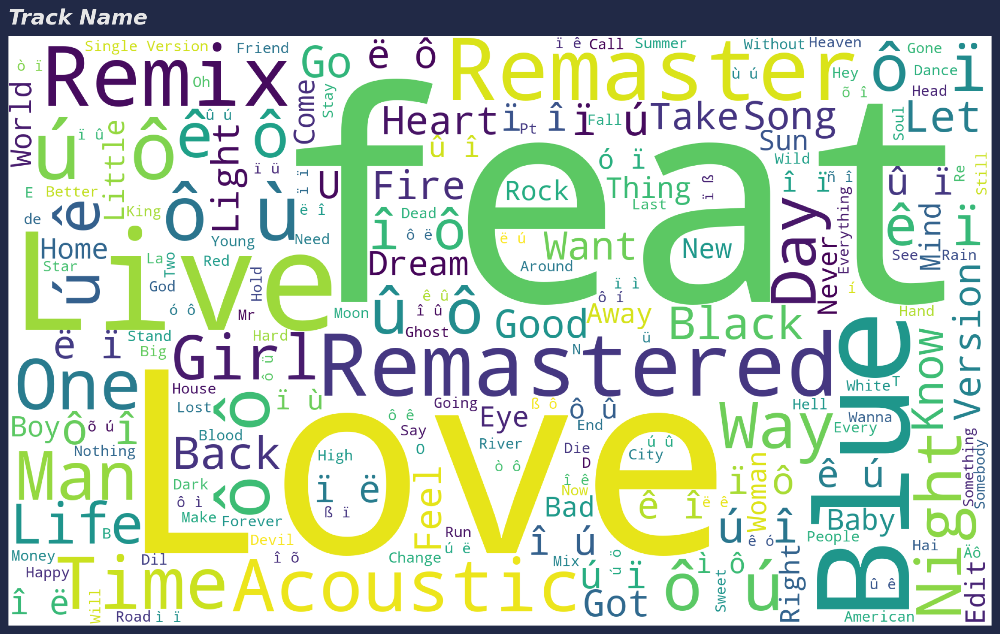

In [33]:
plt.figure(figsize=(15,15))
wordcloud = WordCloud(
    background_color='white',
    width = 2000,
    height = 1200
).generate(" ".join(train["Track Name"])) 

plt.title("Track Name")
plt.imshow(wordcloud)
plt.axis('off')

In [42]:
print("memeriksa Track name dengan genre music nya: \n") 
for genre in list(class_genre.values()):
    print(f"Genre {genre}>") 
    per = train[train.Class_Genre == genre]
    print(f"Punya: {per['Track Name'].nunique()} Track\n") 

memeriksa Track name dengan genre music nya: 

Genre Acoustic/Folk>
Punya: 606 Track

Genre Alt Music>
Punya: 1361 Track

Genre Blues>
Punya: 1240 Track

Genre Bollywood>
Punya: 401 Track

Genre Country>
Punya: 384 Track

Genre HipHop>
Punya: 1435 Track

Genre Indie Alt>
Punya: 2535 Track

Genre Instrumental>
Punya: 562 Track

Genre Metal>
Punya: 1826 Track

Genre Pop>
Punya: 2416 Track

Genre Rock>
Punya: 4694 Track



In [ ]:
# Numerical features

In [45]:
train[number].describe()

,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature
count,17568.000000,17996.000000,17996.000000,15982.000000,17996.000000,17996.000000,17996.000000,17996.000000,13619.000000,17996.000000,17996.000000,17996.000000,1.799600e+04,17996.000000
mean,44.512124,0.543433,0.662777,5.952447,-7.910660,0.636753,0.079707,0.247082,0.177562,0.196170,0.486208,122.623294,2.007445e+05,3.924039
std,17.426928,0.166268,0.235373,3.196854,4.049151,0.480949,0.083576,0.310632,0.304048,0.159212,0.240195,29.571527,1.119891e+05,0.361618
min,1.000000,0.059600,0.000020,1.000000,-39.952000,0.000000,0.022500,0.000000,0.000001,0.011900,0.018300,30.557000,5.016500e-01,1.000000
25%,33.000000,0.432000,0.509000,3.000000,-9.538000,0.000000,0.034800,0.004300,0.000089,0.097500,0.297000,99.620750,1.663370e+05,4.000000
50%,44.000000,0.545000,0.700000,6.000000,-7.016000,1.000000,0.047400,0.081400,0.003910,0.129000,0.481000,120.065500,2.091600e+05,4.000000
75%,56.000000,0.659000,0.860000,9.000000,-5.189000,1.000000,0.083000,0.434000,0.200000,0.258000,0.672000,141.969250,2.524900e+05,4.000000
max,100.000000,0.989000,1.000000,11.000000,1.355000,1.000000,0.955000,0.996000,0.996000,1.000000,0.986000,217.416000,1.477187e+06,5.000000


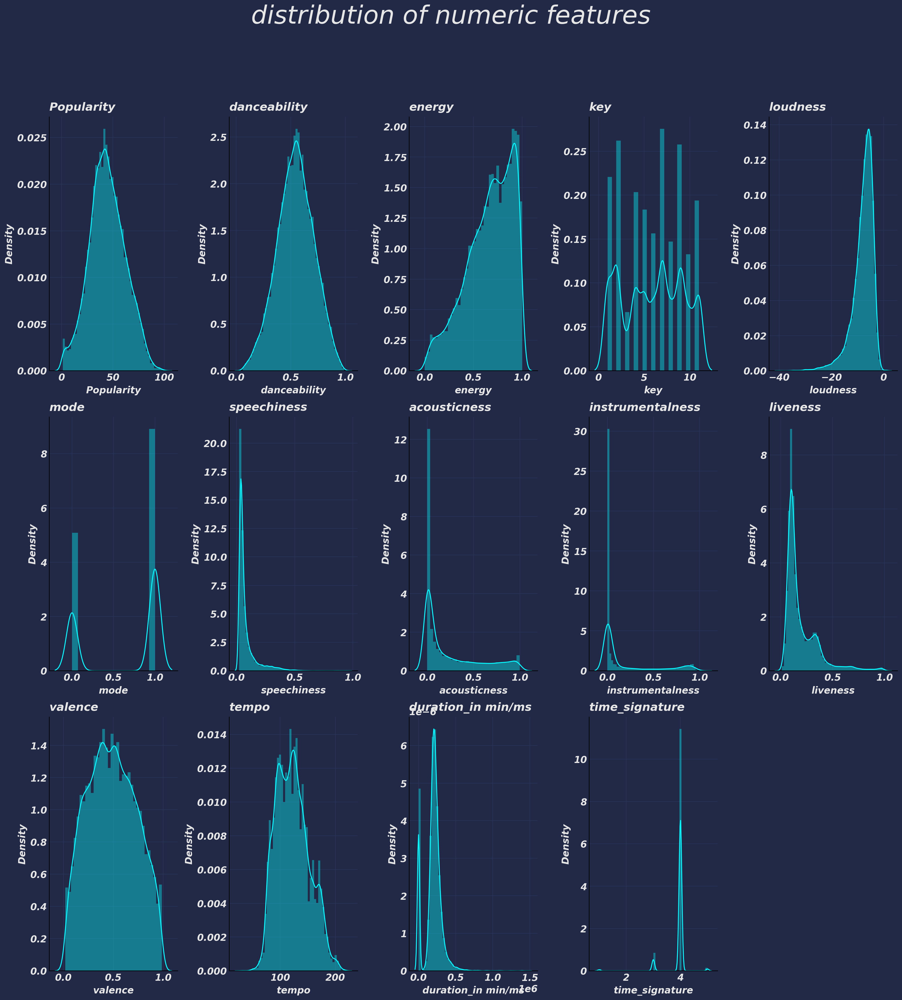

In [31]:
plt.figure(figsize=(20,20))

for i,j in enumerate(number): 
    plt.subplot(3,5,i+1) 
    
    sns.distplot(train[j]) 
    plt.title(j) 
    
plt.suptitle("distribution of numeric features", size=40, y=1.1) 
plt.tight_layout() 
plt.show() 

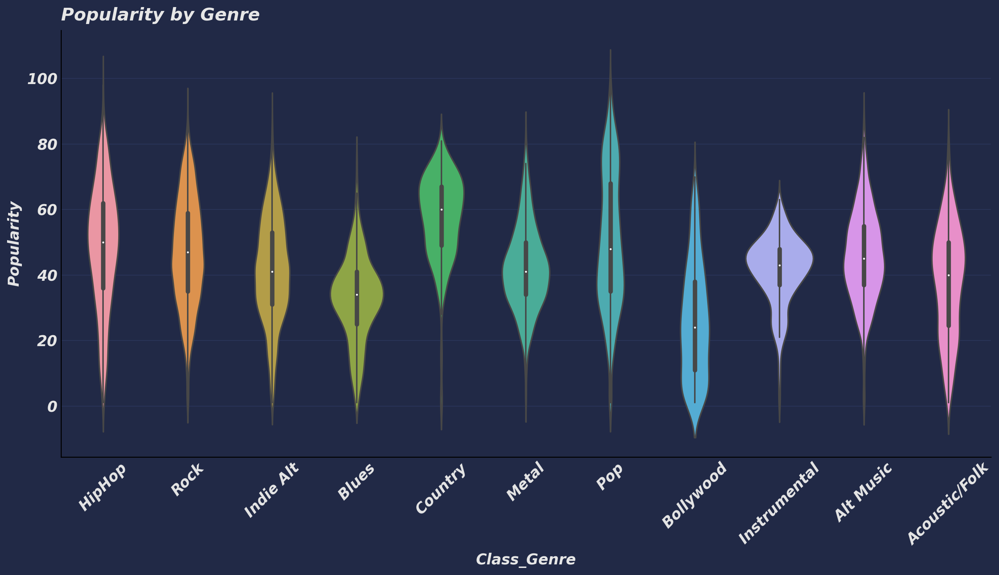

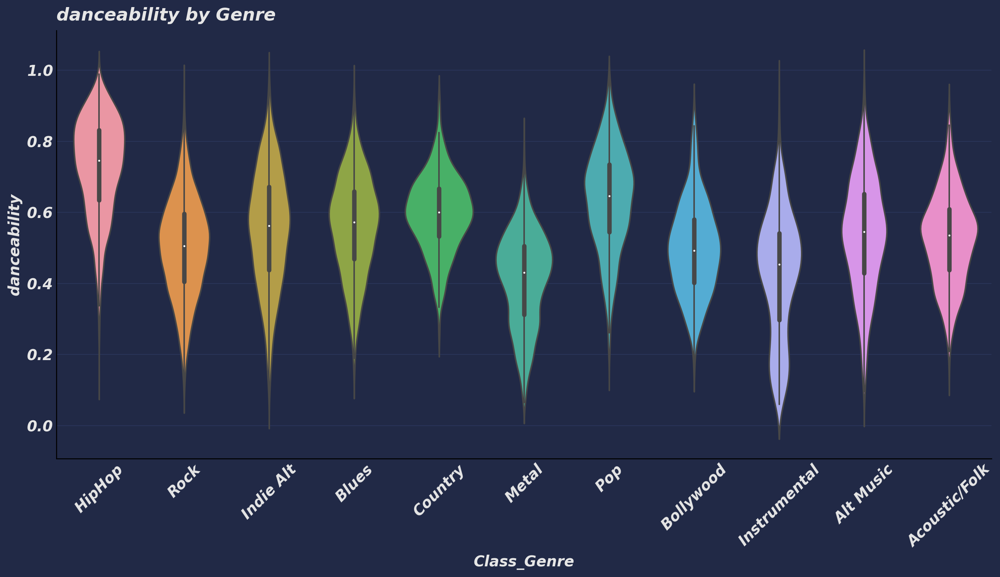

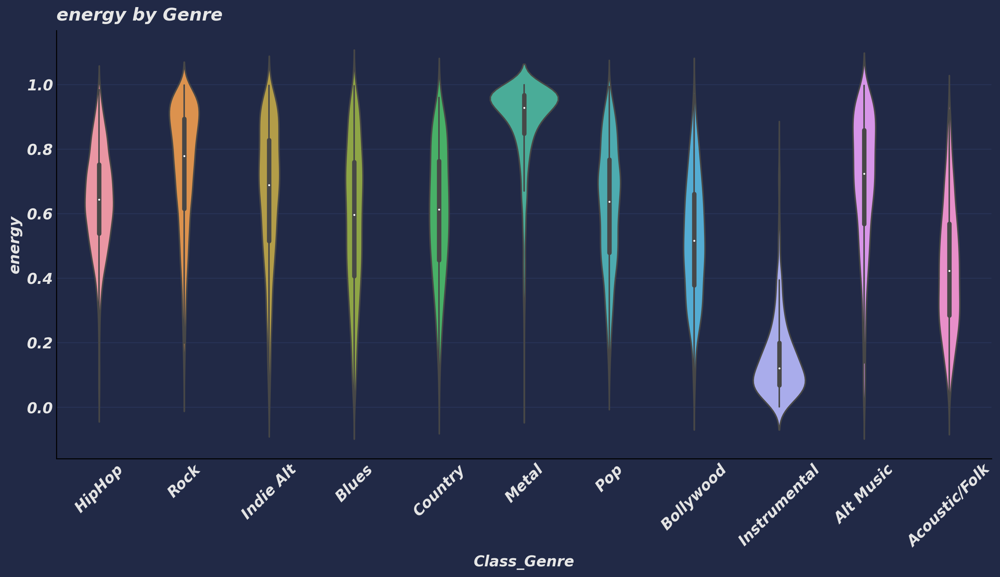

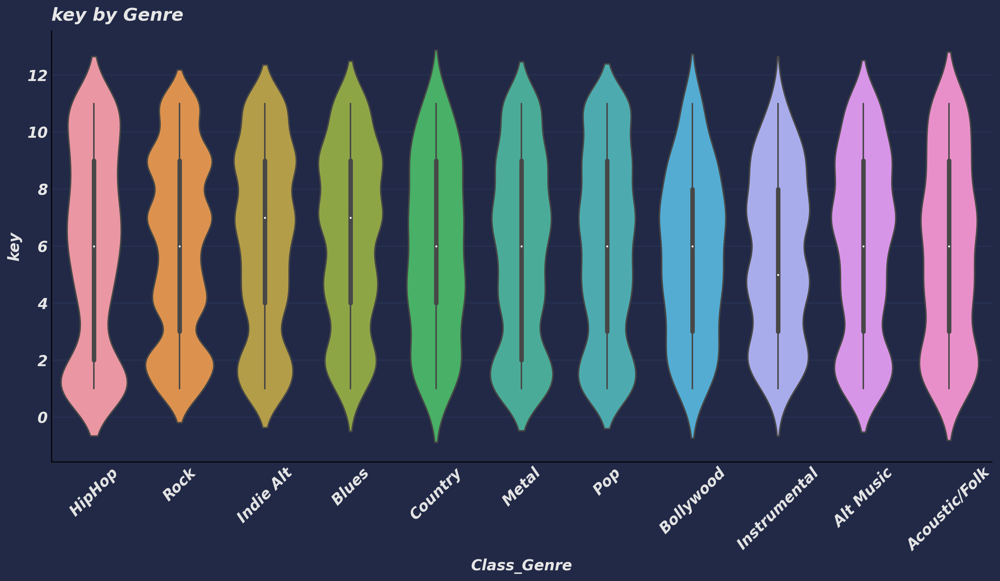

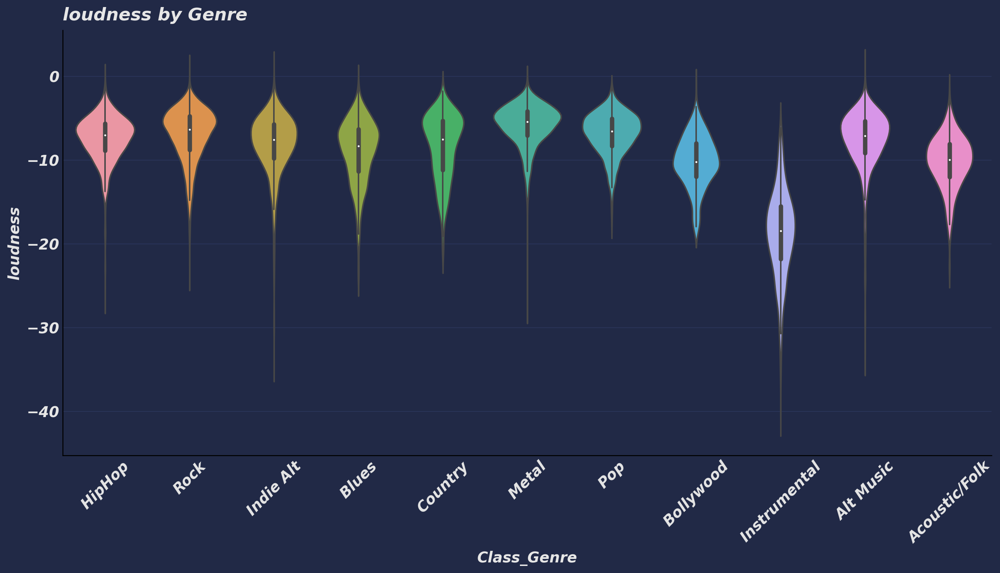

...

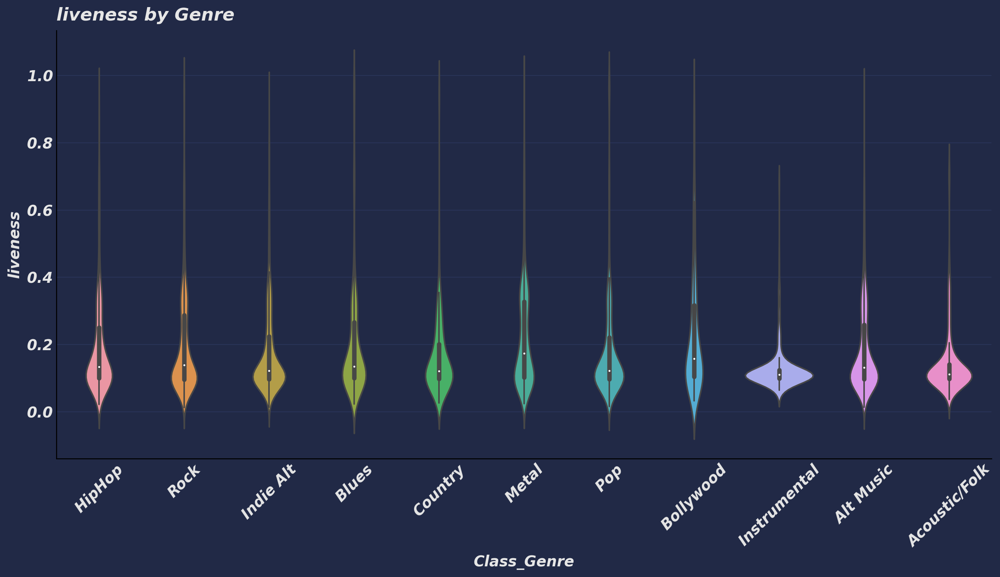

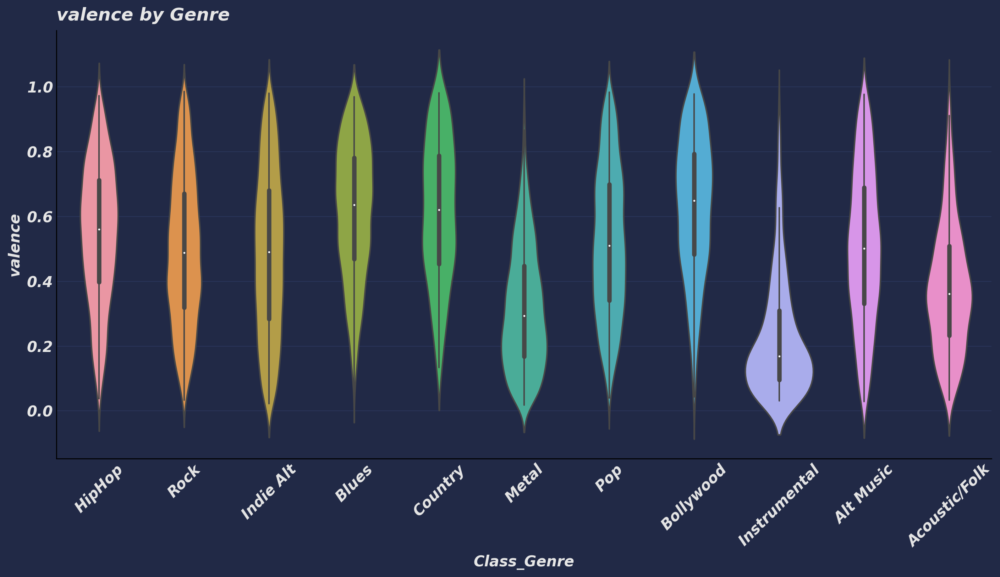

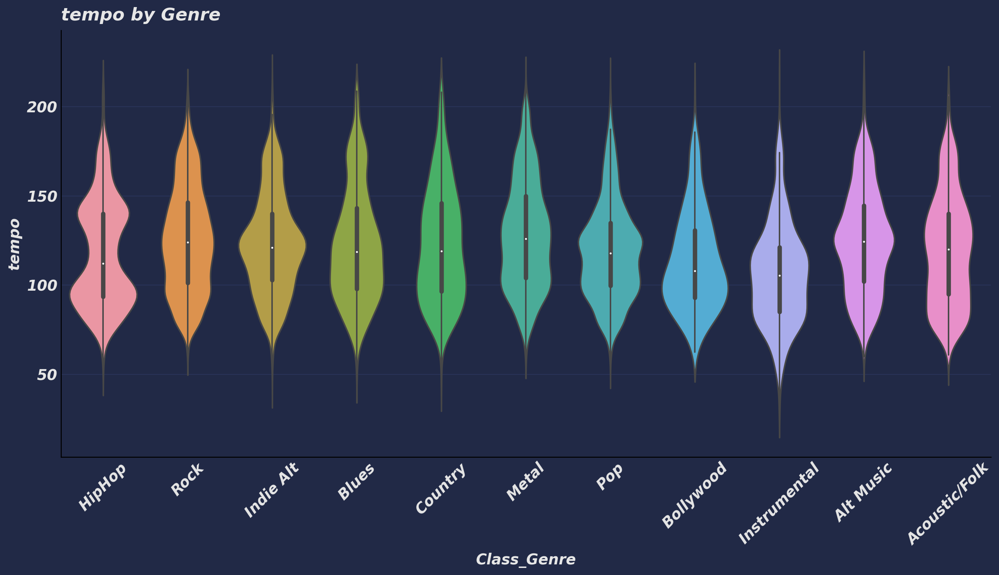

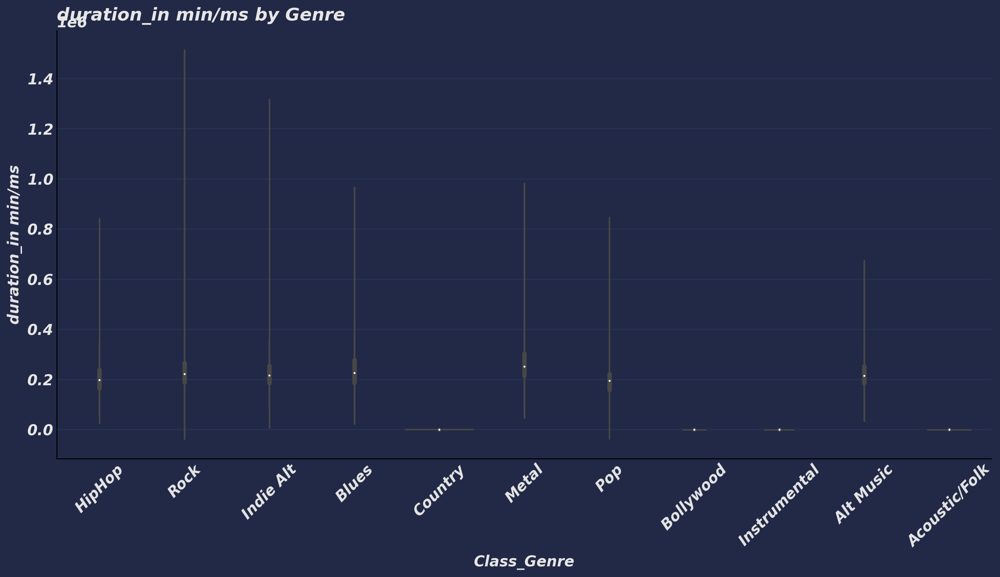

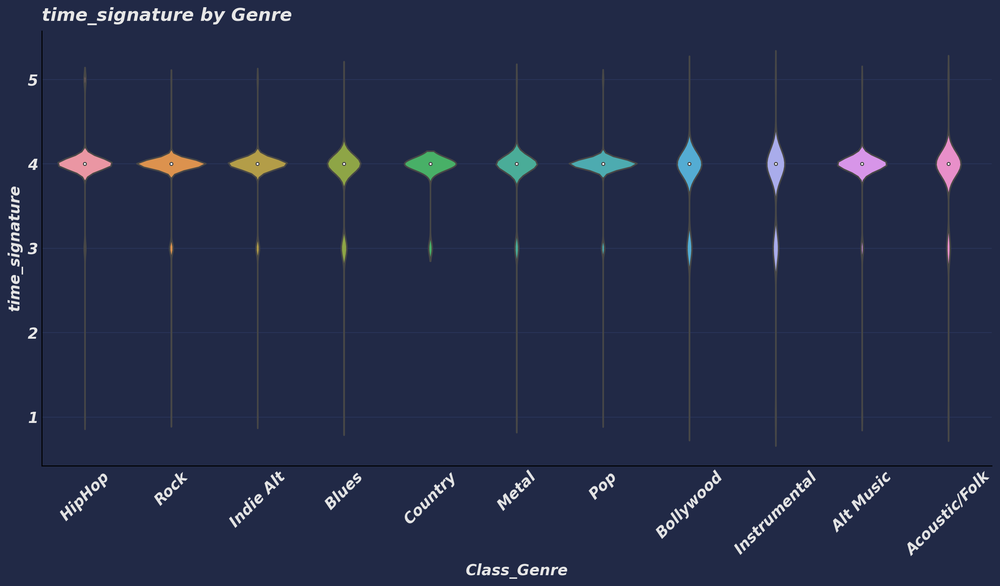

In [69]:
for i in number:
    plt.figure(figsize=(17, 8)) 
    sns.violinplot(x=train.Class_Genre, y=train[i])
    plt.title(f"{i} by Genre")
    plt.xticks(rotation=45) 
    plt.show() 
                   

In [ ]:
#key dan mode terlihat tidak Ada perbedaan 

In [ ]:
instumental,key,popularity

In [85]:
train[["instrumentalness", "key", "Popularity"]].isnull(). sum() 

instrumentalness    4377
key                 2014
Popularity           428
dtype: int64

In [9]:
for i in [train,test]:
    i["key"] = i["key"].fillna(7).astype("int32") 

In [10]:
for i in [train,test]:
    i["Popularity"] = train.groupby("Artist Name")["Popularity"].apply(lambda x: x.fillna(x.median())) 
    i["Popularity"].fillna(train["Popularity"].median(), inplace=True)
    

In [11]:
for i in [train,test]:
    i["instrumentalness"].fillna(train["instrumentalness"].median(), inplace=True) 

## Multivariat analysis

In [124]:
populer = train.query("Popularity > 95 or Popularity < 5") 

In [133]:
artist = populer[["Artist Name","Popularity"]].sort_values("Popularity", ascending=False)

#paling populer
artist.head() 

,Artist Name,Popularity
13489,Måneskin,100.0
11781,Lil Nas X,100.0
187,Olivia Rodrigo,99.0
953,Doja Cat,98.0
12714,"The Kid LAROI, Justin Bieber",97.0


In [134]:
#paling rendah  
artist.tail()

,Artist Name,Popularity
3586,Sonny Boy Williamson II,1.0
7535,Lyres,1.0
3646,Pastime,1.0
14022,ODB,1.0
8937,The Spencer Davis Group,1.0


In [132]:
track = populer[["Artist Name", "Track Name", "Popularity"]].sort_values("Popularity", ascending=False) 

In [136]:
#Top 10 track 
track.head(10)

,Artist Name,Track Name,Popularity
13489,Måneskin,Beggin',100.0
11781,Lil Nas X,MONTERO (Call Me By Your Name),100.0
187,Olivia Rodrigo,good 4 u,99.0
953,Doja Cat,Kiss Me More (feat. SZA),98.0
12714,"The Kid LAROI, Justin Bieber",STAY (with Justin Bieber),97.0
13869,Ed Sheeran,Bad Habits,97.0
14830,"The Kid LAROI, Justin Bieber",STAY (with Justin Bieber),97.0
7925,Masked Wolf,Astronaut In The Ocean,97.0
16394,Polo G,RAPSTAR,96.0
15707,Polo G,RAPSTAR,96.0


In [19]:
train.Class_Genre.value_counts()

Rock             4949
Indie Alt        2587
Pop              2524
Metal            1854
HipHop           1447
Alt Music        1373
Blues            1272
Acoustic/Folk     625
Instrumental      576
Bollywood         402
Country           387
Name: Class_Genre, dtype: int64

In [27]:
genre_by_numeric = train.drop(["Artist Name","Track Name"],axis =1) 
genre_by_numeric.groupby("Class_Genre").mean() 

,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature
Class_Genre,,,,,,,,,,,,,,
Acoustic/Folk,39.184000,0.525798,0.435147,5.918400,-10.240144,0.790400,0.043510,0.579951,0.078366,0.145641,0.382684,120.204082,4.121132,3.859200
Alt Music,45.934086,0.536833,0.688304,6.080845,-7.781162,0.664239,0.067848,0.188958,0.174343,0.188059,0.505400,124.873452,225403.860160,3.941733
Blues,32.996069,0.561220,0.577879,6.349843,-9.055176,0.665881,0.061240,0.388652,0.087441,0.207682,0.612596,122.748731,247517.368711,3.834906
Bollywood,26.328358,0.498281,0.521456,5.825871,-10.213672,0.644279,0.078229,0.727855,0.100660,0.236150,0.627075,113.519682,4.971157,3.820896
Country,57.002584,0.595506,0.600072,5.974160,-8.486959,0.940568,0.041906,0.313100,0.007987,0.166787,0.612765,123.003475,3.391492,3.932817
HipHop,48.623359,0.725989,0.642619,5.967519,-7.469736,0.524534,0.232698,0.202211,0.029822,0.195609,0.545974,117.940362,207435.806496,3.991016
Indie Alt,41.583688,0.552541,0.653723,6.236954,-8.249528,0.650947,0.067378,0.228830,0.236940,0.182585,0.487472,123.230027,229285.001546,3.944724
Instrumental,41.633681,0.425584,0.155145,5.899306,-18.796507,0.625000,0.045550,0.906322,0.739108,0.128216,0.229589,106.331550,4.117292,3.729167
Metal,42.321197,0.411870,0.875775,5.905609,-5.892958,0.587379,0.088745,0.026877,0.216280,0.227966,0.320031,128.338720,270761.782632,3.899137


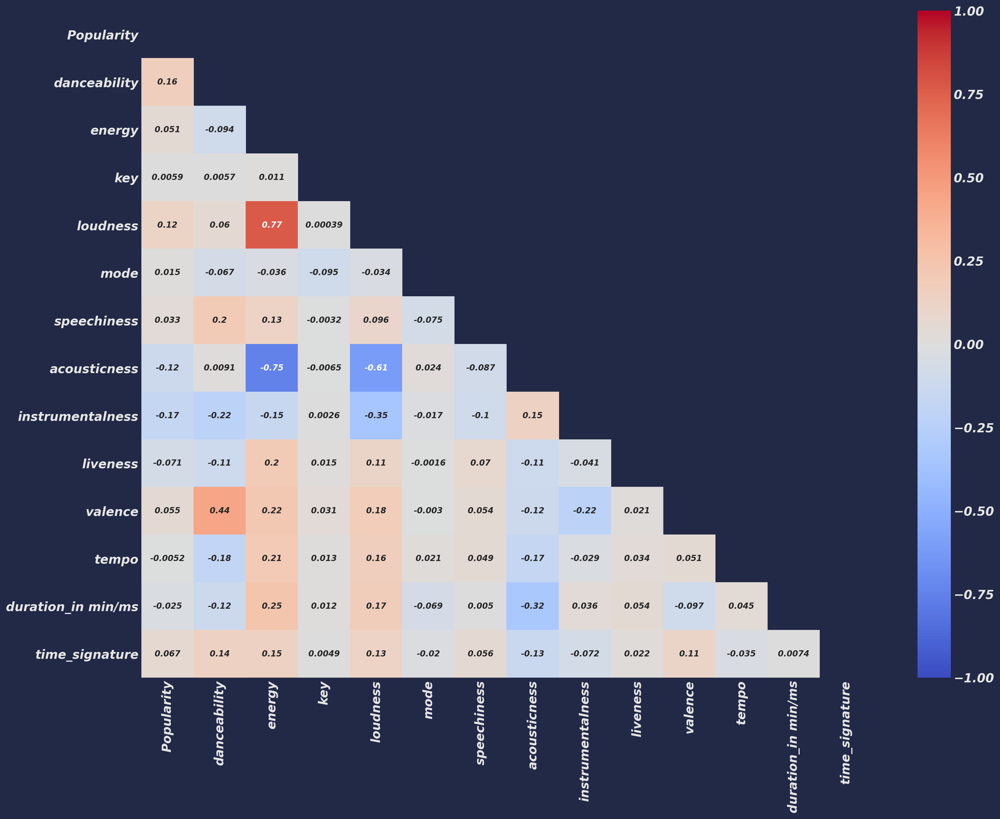

In [34]:
cor = np.triu(train.corr())

plt.figure(figsize=(20,15))
sns.heatmap(train.corr(), mask=cor, annot=True,vmin=-1,vmax=1, cmap="coolwarm") 

## Feature engineering

In [41]:
train.sample(10)

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class_Genre
6772,Silverchair,Cemetery - Acoustic,28.0,0.462,0.408,4,-9.036,0,0.0337,0.105000,0.000018,0.1060,0.112,108.745,246893.000,4,Rock
7280,Nick Mulvey,Fever To The Form,65.0,0.358,0.546,7,-8.927,0,0.0296,0.795000,0.058600,0.1110,0.264,106.489,252960.000,3,Pop
8016,Ustad Raees Khan,Hans Dhuni,25.0,0.508,0.650,9,-9.123,1,0.0286,0.404000,0.349000,0.0664,0.173,99.925,3.987,4,Acoustic/Folk
3671,Republica,Ready to Go,49.0,0.559,0.952,7,-4.680,1,0.0544,0.000242,0.192000,0.2040,0.243,130.047,301533.000,4,Alt Music
9491,Buddy Burton & Fats Hudson,Blue Guitar Stomp,28.0,0.533,0.162,5,-15.774,1,0.0550,0.994000,0.671000,0.1200,0.764,182.717,181551.000,4,Blues
15483,DENM,Life's 2 Short,50.0,0.485,0.707,7,-5.598,1,0.0765,0.339000,0.003910,0.1600,0.541,79.744,240728.000,4,Alt Music
2184,Nana Adjoa,No Room,49.0,0.561,0.439,9,-12.044,1,0.0369,0.458000,0.050300,0.1050,0.307,145.425,209839.000,3,Indie Alt
3011,Noel Gallagher's High Flying Birds,If I Had A Gun,49.0,0.295,0.754,6,-3.160,0,0.0349,0.046500,0.051400,0.1640,0.180,152.465,249107.000,4,Rock
17257,Flying Colors,More,34.0,0.583,0.790,3,-8.165,1,0.0423,0.009020,0.000144,0.0797,0.480,133.021,429533.000,4,Metal
14664,Walk Off the Earth,Red Hands,49.0,0.688,0.846,7,-5.867,1,0.0268,0.005580,0.003910,0.2230,0.672,102.523,180880.000,4,Rock


In [43]:
for i in [train,test]:
    i["length_of_artist_name"] = i["Artist Name"].str.len()
    i["length_of_track_name"] = i["Track Name"].str.len()
    
    i["length_words_artist"] = i["Artist Name"].str.split().str.len()
    i["length_words_track"] = i["Track Name"].str.split().str.len()
    
    

In [62]:
for i in [train,test]:
    i["most_popularity"] = i.groupby("Artist Name")["Popularity"].transform("max") 
    i["most_energy"] = i.groupby("Artist Name")["energy"].transform("max") 
    

In [65]:
for i in [train,test]:
    i["new"] = (i.danceability + i.energy)/2

In [71]:
for i in [train,test]:
    i["new2"] = i["tempo"] % i["duration_in min/ms"]

In [113]:
train.sample(5)

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class_Genre,length_of_artist_name,length_of_track_name,length_words_artist,length_words_track,most_popularity,most_energy,new,new2
14527,The Byrds,Turn! Turn! Turn! (To Everything There Is a Se...,67.0,0.452,0.818,2,-8.124,1,0.0439,0.13500,0.000027,0.052,0.7550,124.474,229360.0,4,Alt Music,9,51,2,9,67.0,0.818,0.6350,124.474
7417,Frank Stokes,Downtown Blues,33.0,0.539,0.264,11,-14.354,1,0.0383,0.96900,0.000681,0.361,0.6770,162.935,197427.0,4,Blues,12,14,2,2,33.0,0.264,0.4015,162.935
5055,Westside Gunn,The Hurt Business (feat. M V P) - Remix,35.0,0.460,0.876,7,-5.690,1,0.2970,0.47100,0.003910,0.144,0.5570,166.715,294825.0,4,HipHop,13,39,2,9,51.0,0.876,0.6680,166.715
4177,Mazare,Berserker,48.0,0.221,0.809,10,-2.879,1,0.0665,0.00218,0.000043,0.138,0.0945,118.021,265875.0,5,Rock,6,9,1,1,48.0,0.809,0.5150,118.021
6264,Celeste,Tonight Tonight,61.0,0.611,0.834,11,-4.528,0,0.0299,0.05440,0.000016,0.232,0.6430,109.997,219440.0,4,Indie Alt,7,15,1,2,61.0,0.834,0.7225,109.997


In [114]:
for i in [train,test]:
    i.drop(["Track Name", "Artist Name"], axis=1, inplace=True) 

## final 

In [115]:
print(train.shape)
print(test.shape)
print(train.duplicated().sum())
print(train.isnull().any().sum())
print(train.isnull().any().sum())

(17996, 23)
(7713, 22)
1
0
0


In [116]:
train

,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class_Genre,length_of_artist_name,length_of_track_name,length_words_artist,length_words_track,most_popularity,most_energy,new,new2
0,60.0,0.854,0.564,1,-4.964,1,0.0485,0.017100,0.003910,0.0849,0.8990,134.071,234596.0,4,HipHop,10,37,2,7,82.0,0.843,0.7090,134.071
1,54.0,0.382,0.814,3,-7.230,1,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4,Rock,6,12,1,3,79.0,0.814,0.5980,116.454
2,35.0,0.434,0.614,6,-8.334,1,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4,Indie Alt,13,18,2,5,50.0,0.854,0.5240,147.681
3,66.0,0.853,0.597,10,-6.528,0,0.0555,0.021200,0.003910,0.1220,0.5690,107.033,173968.0,4,HipHop,4,26,1,5,66.0,0.713,0.7250,107.033
4,53.0,0.167,0.975,2,-4.279,1,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4,Rock,21,33,4,6,81.0,0.983,0.5710,199.060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17991,35.0,0.166,0.109,7,-17.100,0,0.0413,0.993000,0.824000,0.0984,0.1770,171.587,193450.0,3,Indie Alt,11,9,1,2,45.0,0.184,0.1375,171.587
17992,27.0,0.638,0.223,11,-10.174,0,0.0329,0.858000,0.000016,0.0705,0.3350,73.016,257067.0,4,Blues,8,8,1,2,27.0,0.223,0.4305,73.016
17993,34.0,0.558,0.981,4,-4.683,0,0.0712,0.000030,0.000136,0.6660,0.2620,105.000,216222.0,4,Metal,15,12,3,2,34.0,0.981,0.7695,105.000
17994,29.0,0.215,0.805,6,-12.757,0,0.1340,0.001290,0.916000,0.2560,0.3550,131.363,219693.0,4,Metal,7,14,1,2,29.0,0.805,0.5100,131.363


In [117]:
train.to_csv("train_genre_music(clean).csv", index=False) 
test.to_csv("test_genre_music(clean).csv", index=False) 